In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import  numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import scipy.stats as stats
import warnings
pd.options.display.max_columns=None


In [2]:
test = pd.read_csv('/kaggle/input/playground-series-s3e24/test.csv')
test.head() 

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries
0,159256,40,165,70,84.0,1.2,1.2,1,1,130,89,107,200,186,49,115,14.2,1,0.9,19,25,32,0
1,159257,80,160,60,93.0,1.0,1.0,2,2,144,72,93,172,158,35,104,13.0,1,1.1,20,12,24,0
2,159258,60,170,70,86.5,0.6,0.7,1,1,117,75,92,161,173,39,88,15.4,1,1.4,38,60,36,0
3,159259,40,160,50,67.0,0.3,0.4,1,1,116,62,91,213,47,75,128,14.5,1,0.6,25,18,10,1
4,159260,40,170,75,89.4,1.0,0.9,1,1,132,94,79,170,100,39,123,16.5,1,1.0,30,39,27,1


In [3]:
train = pd.read_csv('/kaggle/input/playground-series-s3e24/train.csv')
train.head()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,0,55,165,60,81.0,0.5,0.6,1,1,135,87,94,172,300,40,75,16.5,1,1.0,22,25,27,0,1
1,1,70,165,65,89.0,0.6,0.7,2,2,146,83,147,194,55,57,126,16.2,1,1.1,27,23,37,1,0
2,2,20,170,75,81.0,0.4,0.5,1,1,118,75,79,178,197,45,93,17.4,1,0.8,27,31,53,0,1
3,3,35,180,95,105.0,1.5,1.2,1,1,131,88,91,180,203,38,102,15.9,1,1.0,20,27,30,1,0
4,4,30,165,60,80.5,1.5,1.0,1,1,121,76,91,155,87,44,93,15.4,1,0.8,19,13,17,0,1


In [4]:
combined = pd.concat([test,train])
combined.head()

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,159256,40,165,70,84.0,1.2,1.2,1,1,130,89,107,200,186,49,115,14.2,1,0.9,19,25,32,0,NaN
1,159257,80,160,60,93.0,1.0,1.0,2,2,144,72,93,172,158,35,104,13.0,1,1.1,20,12,24,0,NaN
2,159258,60,170,70,86.5,0.6,0.7,1,1,117,75,92,161,173,39,88,15.4,1,1.4,38,60,36,0,NaN
3,159259,40,160,50,67.0,0.3,0.4,1,1,116,62,91,213,47,75,128,14.5,1,0.6,25,18,10,1,NaN
4,159260,40,170,75,89.4,1.0,0.9,1,1,132,94,79,170,100,39,123,16.5,1,1.0,30,39,27,1,NaN


In [6]:
combined.info()

<class 'pandas.core.frame.DataFrame'>
Index: 265427 entries, 0 to 159255
Data columns (total 24 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   265427 non-null  int64  
 1   age                  265427 non-null  int64  
 2   height(cm)           265427 non-null  int64  
 3   weight(kg)           265427 non-null  int64  
 4   waist(cm)            265427 non-null  float64
 5   eyesight(left)       265427 non-null  float64
 6   eyesight(right)      265427 non-null  float64
 7   hearing(left)        265427 non-null  int64  
 8   hearing(right)       265427 non-null  int64  
 9   systolic             265427 non-null  int64  
 10  relaxation           265427 non-null  int64  
 11  fasting blood sugar  265427 non-null  int64  
 12  Cholesterol          265427 non-null  int64  
 13  triglyceride         265427 non-null  int64  
 14  HDL                  265427 non-null  int64  
 15  LDL                  2

In [7]:
combined.dtypes

id                       int64
age                      int64
height(cm)               int64
weight(kg)               int64
waist(cm)              float64
eyesight(left)         float64
eyesight(right)        float64
hearing(left)            int64
hearing(right)           int64
systolic                 int64
relaxation               int64
fasting blood sugar      int64
Cholesterol              int64
triglyceride             int64
HDL                      int64
LDL                      int64
hemoglobin             float64
Urine protein            int64
serum creatinine       float64
AST                      int64
ALT                      int64
Gtp                      int64
dental caries            int64
smoking                float64
dtype: object

In [8]:
combined.isnull().sum()/len(combined*100)

id                     0.000000
age                    0.000000
height(cm)             0.000000
weight(kg)             0.000000
waist(cm)              0.000000
eyesight(left)         0.000000
eyesight(right)        0.000000
hearing(left)          0.000000
hearing(right)         0.000000
systolic               0.000000
relaxation             0.000000
fasting blood sugar    0.000000
Cholesterol            0.000000
triglyceride           0.000000
HDL                    0.000000
LDL                    0.000000
hemoglobin             0.000000
Urine protein          0.000000
serum creatinine       0.000000
AST                    0.000000
ALT                    0.000000
Gtp                    0.000000
dental caries          0.000000
smoking                0.400001
dtype: float64

In [9]:
combined.columns

Index(['id', 'age', 'height(cm)', 'weight(kg)', 'waist(cm)', 'eyesight(left)',
       'eyesight(right)', 'hearing(left)', 'hearing(right)', 'systolic',
       'relaxation', 'fasting blood sugar', 'Cholesterol', 'triglyceride',
       'HDL', 'LDL', 'hemoglobin', 'Urine protein', 'serum creatinine', 'AST',
       'ALT', 'Gtp', 'dental caries', 'smoking'],
      dtype='object')

In [10]:
combined.shape

(265427, 24)

In [11]:
combined.describe().T

,count,mean,std,min,25%,50%,75%,max
id,265427.0,132713.000000,76622.319288,0.0,66356.5,132713.0,199069.5,265426.0
age,265427.0,44.354591,11.864380,20.0,40.0,40.0,55.0,85.0
height(cm),265427.0,165.248686,8.826224,135.0,160.0,165.0,170.0,190.0
weight(kg),265427.0,67.136444,12.586326,30.0,60.0,65.0,75.0,130.0
waist(cm),265427.0,83.001151,8.953381,51.0,77.0,83.0,89.0,127.7
eyesight(left),265427.0,1.005389,0.400349,0.1,0.8,1.0,1.2,9.9
eyesight(right),265427.0,1.000387,0.389693,0.1,0.8,1.0,1.2,9.9
hearing(left),265427.0,1.024071,0.153269,1.0,1.0,1.0,1.0,2.0
hearing(right),265427.0,1.023645,0.151941,1.0,1.0,1.0,1.0,2.0
systolic,265427.0,122.492350,12.743802,71.0,114.0,121.0,130.0,213.0


In [13]:
Q1 = combined.quantile(0.25)
Q2 = combined.quantile(0.5)
Q3 = combined.quantile(0.75)
IQR=Q3-Q1
print(IQR)

id                     132713.0
age                        15.0
height(cm)                 10.0
weight(kg)                 15.0
waist(cm)                  12.0
eyesight(left)              0.4
eyesight(right)             0.4
hearing(left)               0.0
hearing(right)              0.0
systolic                   16.0
relaxation                 12.0
fasting blood sugar        13.0
Cholesterol                42.0
triglyceride               88.0
HDL                        19.0
LDL                        38.0
hemoglobin                  2.0
Urine protein               0.0
serum creatinine            0.2
AST                         9.0
ALT                        16.0
Gtp                        26.0
dental caries               0.0
smoking                     1.0
dtype: float64


In [14]:
UL = Q3+(1.5*IQR)
LL = Q1-(1.5*IQR)

In [15]:
combined_new = combined[~((combined<UL)|(combined>LL)).any(axis=1)]

In [16]:
combined_new.shape

(0, 24)

<Axes: >

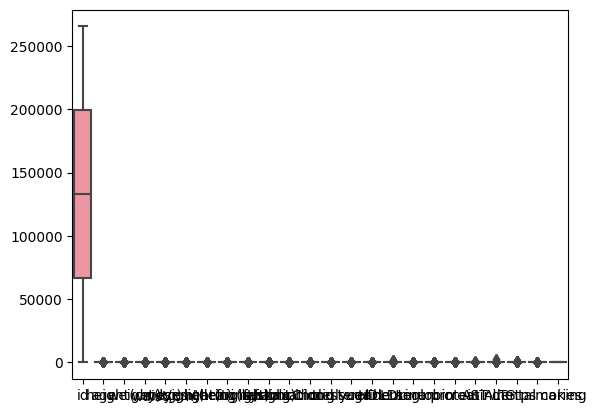

In [17]:
sns.boxplot(combined)

<Axes: >

/opt/conda/lib/python3.10/site-packages/IPython/core/events.py:93: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/opt/conda/lib/python3.10/site-packages/IPython/core/pylabtools.py:152: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


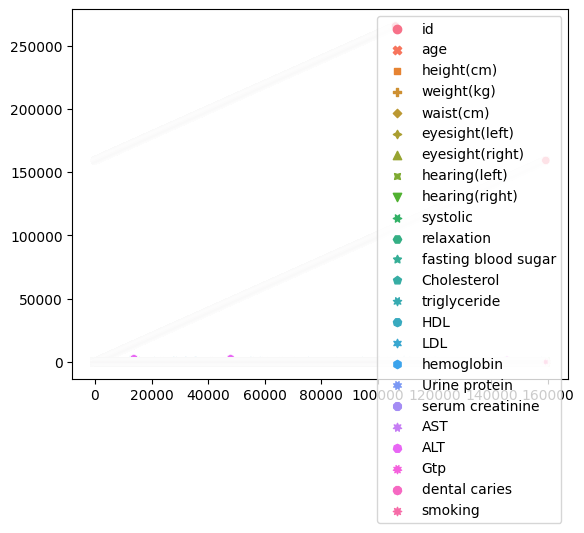

In [18]:
sns.scatterplot(combined)

<Axes: >

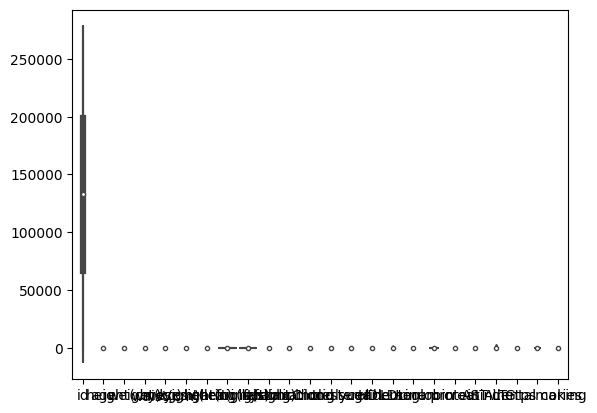

In [19]:
sns.violinplot(combined)

<Axes: >

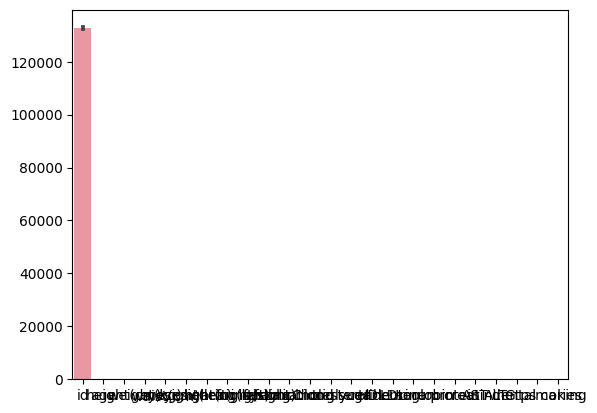

In [20]:
sns.barplot(combined)

<Axes: ylabel='count'>

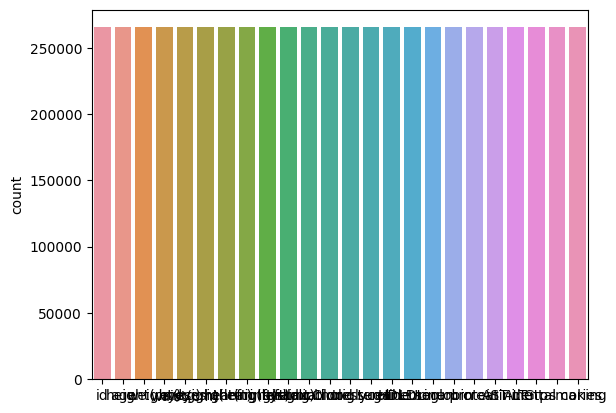

In [6]:
sns.countplot(combined) 

<Axes: ylabel='Density'>

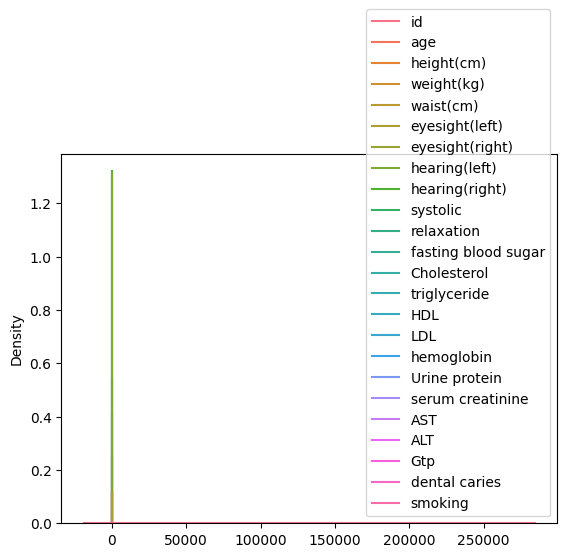

In [7]:
sns.kdeplot(combined) 

/opt/conda/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


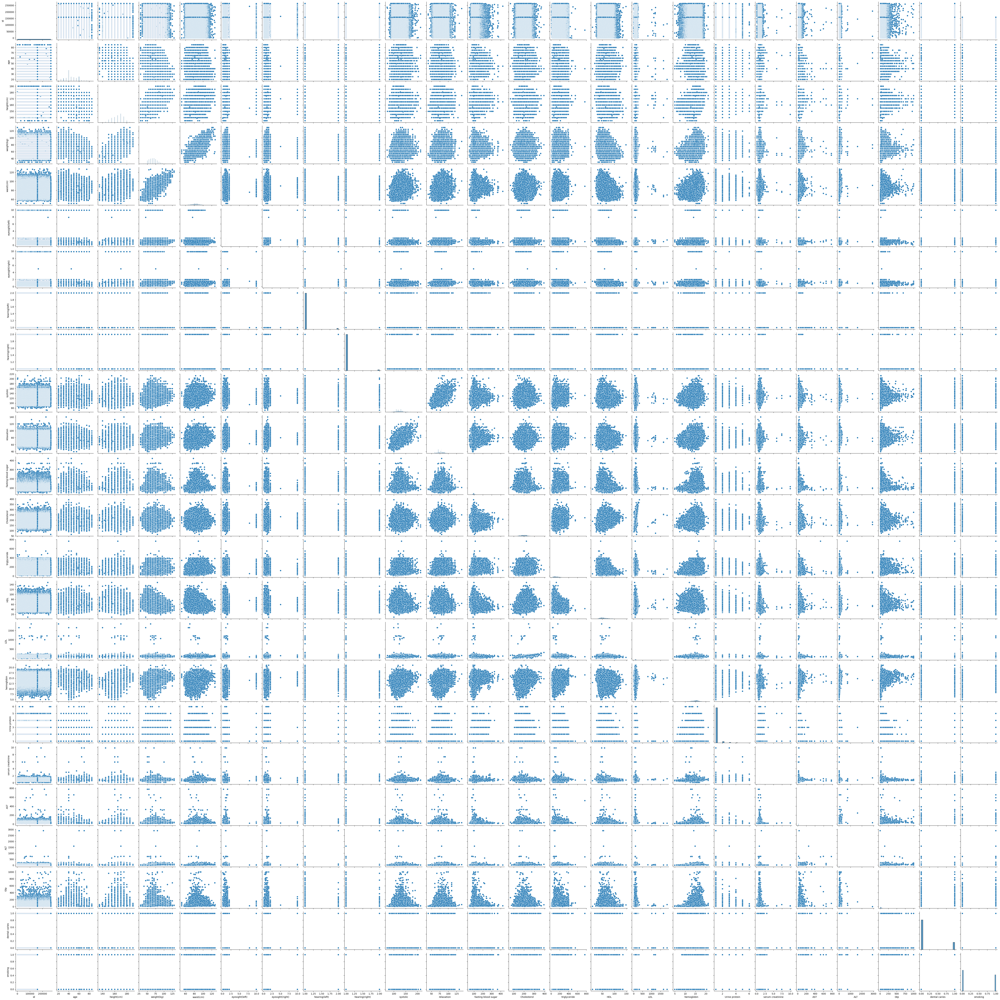

In [9]:
sns.pairplot(combined)

<Axes: >

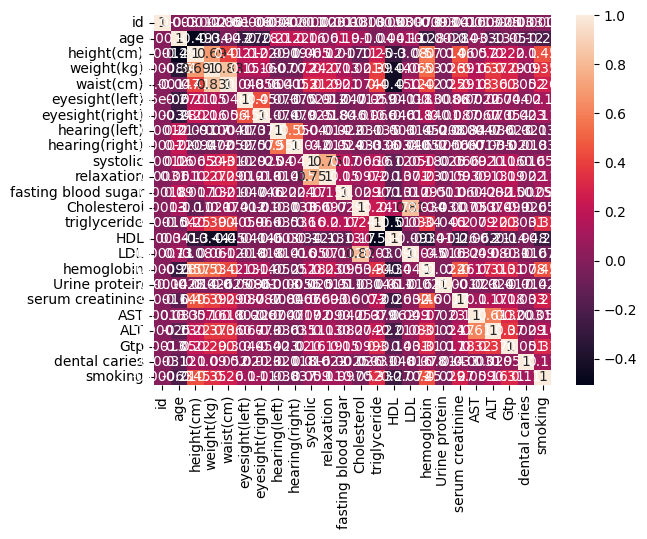

In [8]:
sns.heatmap(combined.corr(),annot=True)

In [10]:
combined.skew

<bound method NDFrame._add_numeric_operations.<locals>.skew of             id  age  height(cm)  weight(kg)  waist(cm)  eyesight(left)  \
0       159256   40         165          70       84.0             1.2   
1       159257   80         160          60       93.0             1.0   
2       159258   60         170          70       86.5             0.6   
3       159259   40         160          50       67.0             0.3   
4       159260   40         170          75       89.4             1.0   
...        ...  ...         ...         ...        ...             ...   
159251  159251   40         155          45       69.0             1.5   
159252  159252   50         155          75       82.0             1.0   
159253  159253   40         160          50       66.0             1.5   
159254  159254   50         165          75       92.0             1.2   
159255  159255   40         145          45       76.4             1.0   

        eyesight(right)  hearing(left)  hearing(

In [11]:
combined.kurt

<bound method NDFrame._add_numeric_operations.<locals>.kurt of             id  age  height(cm)  weight(kg)  waist(cm)  eyesight(left)  \
0       159256   40         165          70       84.0             1.2   
1       159257   80         160          60       93.0             1.0   
2       159258   60         170          70       86.5             0.6   
3       159259   40         160          50       67.0             0.3   
4       159260   40         170          75       89.4             1.0   
...        ...  ...         ...         ...        ...             ...   
159251  159251   40         155          45       69.0             1.5   
159252  159252   50         155          75       82.0             1.0   
159253  159253   40         160          50       66.0             1.5   
159254  159254   50         165          75       92.0             1.2   
159255  159255   40         145          45       76.4             1.0   

        eyesight(right)  hearing(left)  hearing(

In [12]:
cat_cols = combined.select_dtypes(include='object')

In [13]:
for i in cat_cols:
    combined[i].value_counts()
    print(i)
    print(''*50)

In [14]:
num_cols = combined.select_dtypes(include='number')

In [15]:
for i in num_cols:
    combined[i].value_counts()
    print(i)
    print(''*50)

id

age

height(cm)

weight(kg)

waist(cm)

eyesight(left)

eyesight(right)

hearing(left)

hearing(right)

systolic

relaxation

fasting blood sugar

Cholesterol

triglyceride

HDL

LDL

hemoglobin

Urine protein

serum creatinine

AST

ALT

Gtp

dental caries

smoking



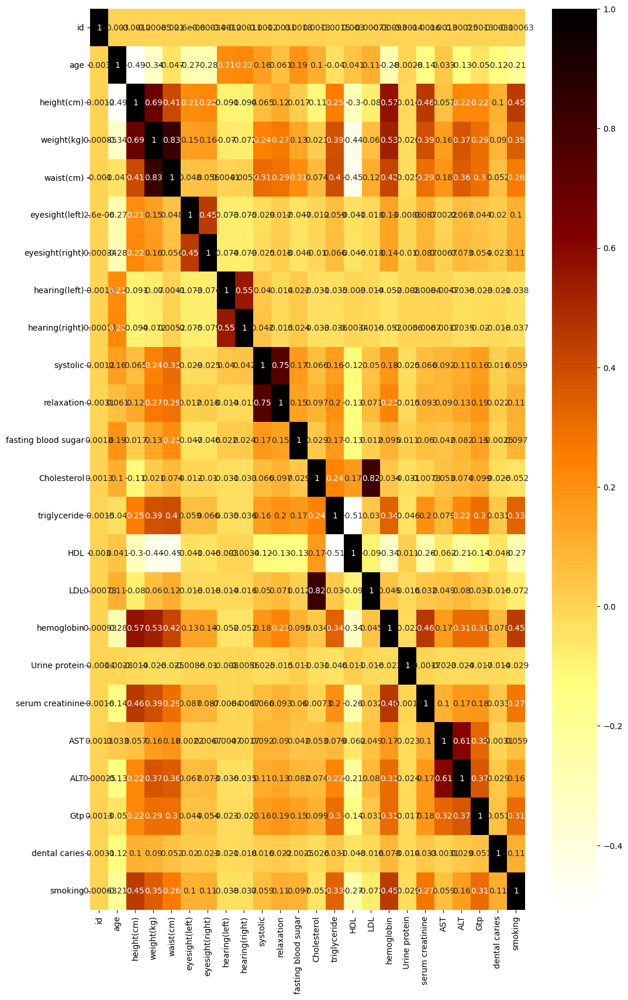

In [16]:
plt.figure(figsize=(12,20))
sns.heatmap(combined.corr(),annot=True,cmap='afmhot_r')
plt.show()

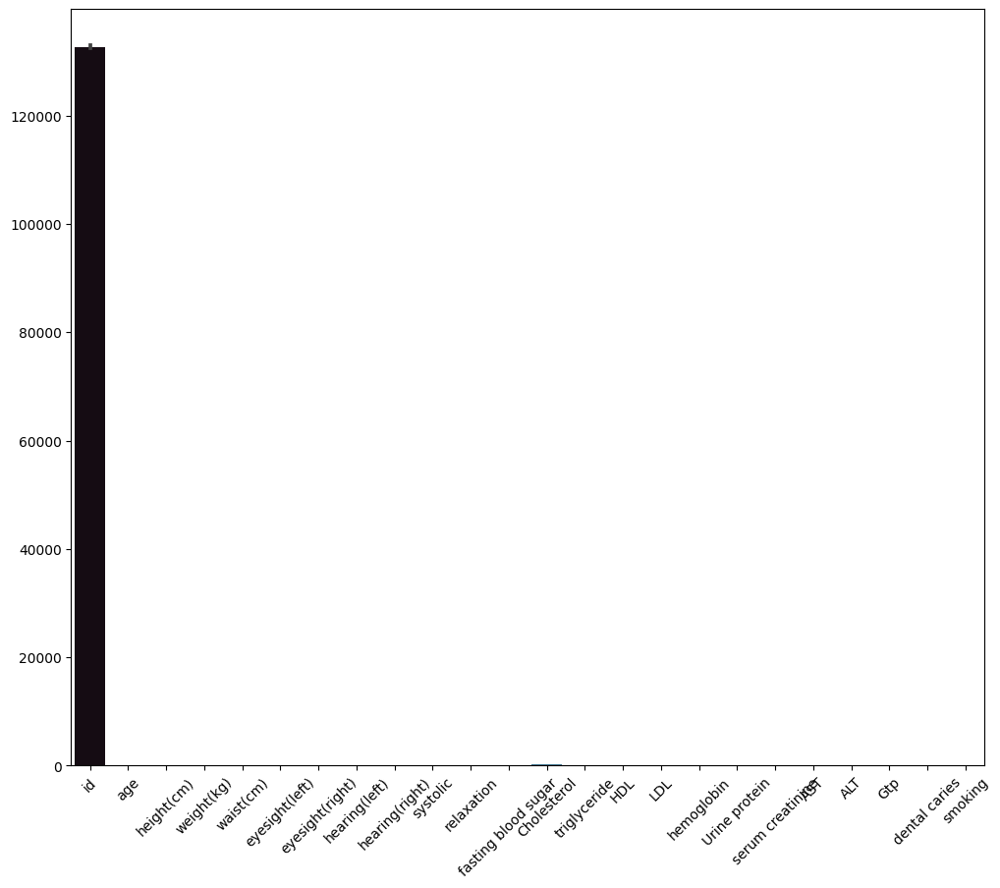

In [17]:
plt.figure(figsize=(12,10))
sns.barplot(data=combined,palette='mako');
plt.xticks(rotation=45);

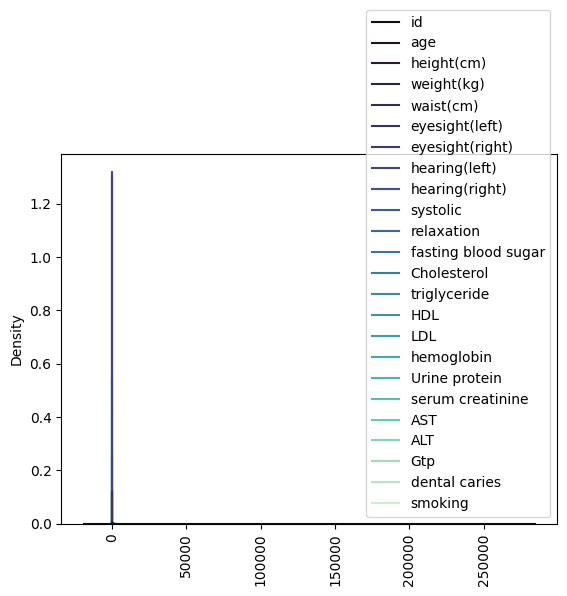

In [18]:
sns.kdeplot(combined,palette='mako');
plt.xticks(rotation=90);

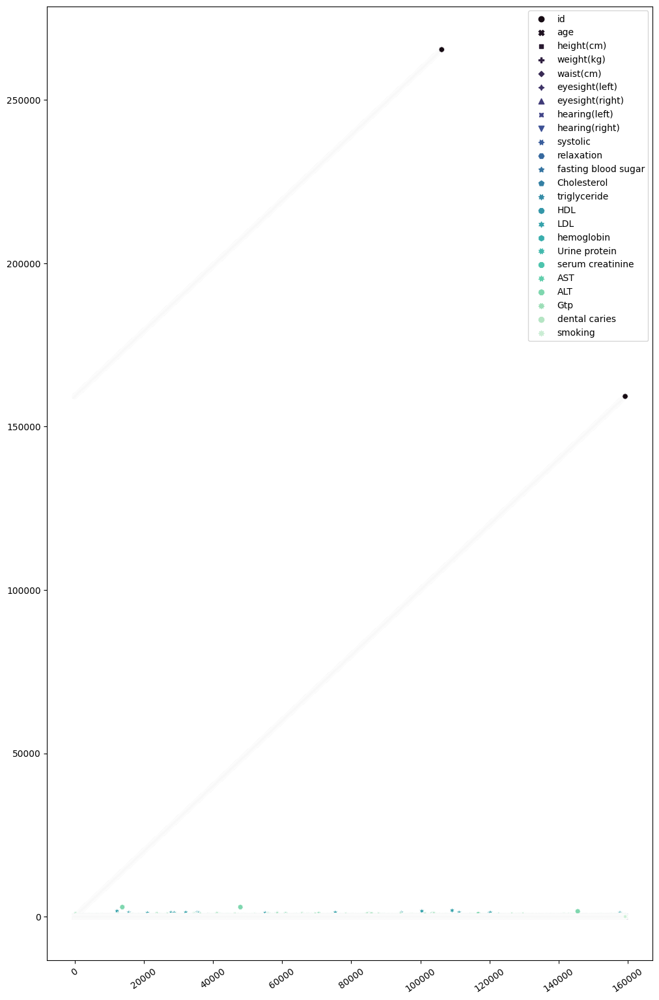

In [19]:
plt.figure(figsize=(12,19))
sns.scatterplot(data=combined,palette='mako');
plt.xticks(rotation=35);

In [20]:
combined.head() 

,id,age,height(cm),weight(kg),waist(cm),eyesight(left),eyesight(right),hearing(left),hearing(right),systolic,relaxation,fasting blood sugar,Cholesterol,triglyceride,HDL,LDL,hemoglobin,Urine protein,serum creatinine,AST,ALT,Gtp,dental caries,smoking
0,159256,40,165,70,84.0,1.2,1.2,1,1,130,89,107,200,186,49,115,14.2,1,0.9,19,25,32,0,NaN
1,159257,80,160,60,93.0,1.0,1.0,2,2,144,72,93,172,158,35,104,13.0,1,1.1,20,12,24,0,NaN
2,159258,60,170,70,86.5,0.6,0.7,1,1,117,75,92,161,173,39,88,15.4,1,1.4,38,60,36,0,NaN
3,159259,40,160,50,67.0,0.3,0.4,1,1,116,62,91,213,47,75,128,14.5,1,0.6,25,18,10,1,NaN
4,159260,40,170,75,89.4,1.0,0.9,1,1,132,94,79,170,100,39,123,16.5,1,1.0,30,39,27,1,NaN


In [7]:
x = combined[['id']]

In [8]:
y = combined[['id']]

In [9]:
from sklearn.model_selection import train_test_split

In [10]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3)

In [11]:
from sklearn.linear_model import LinearRegression

In [12]:
lr = LinearRegression()

In [13]:
lr.fit(x_train,y_train)

LinearRegression()

In [14]:
y_pred=lr.predict(x_test)

In [15]:
y_test.head(), y_pred[0:5]

(           id
 92392   92392
 21739  180995
 91469  250725
 58087   58087
 71048  230304,
 array([[ 92392.],
        [180995.],
        [250725.],
        [ 58087.],
        [230304.]]))

In [16]:
from sklearn.metrics import mean_squared_error

In [17]:
mean_squared_error(y_test,y_pred)

8.903648264887297e-22

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
import matplotlib.pyplot as plt

decision_tree_classification = DecisionTreeClassifier(criterion='entropy', random_state=10)
decision_tree = decision_tree_classification.fit(x_train,y_train)

plt.figure(figsize=(12,8))
plot_tree(decision_tree, max_depth=3, featire_names=x_train.columns, rounded=True)
plt.show() 

In [ ]:
y_pred_test = decision_tree.predict(x_test)
y_pred_train = decision_tree.predict(x_train)
print(decision_tree)

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_train,y_pred_train))

In [ ]:
print(len(y_train,),len(y_pred_train))

In [ ]:
from sklearn.ensemble import RandomFroestClassifier

model = RandomFroestClassifier(n_estimators=100, random_state=42)
model.fit(x_train,y_train)

In [ ]:
y_pred = model.predict(x_test)
print(classification_report(y_test,y_pred))